# Steps to Follow

1. Install Dependencies
2. Load and pre-process the data
3. Data Augmentation
4. Detecting pose using detectron2
5. Classifying cricket shot using pose of a player
6. Evaluating model performance

###1. Install Dependencies

In [ ]:
!pip install!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime pyyaml==5.1

     |████████████████████████████████| 276kB 2.9MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=215c5ef8dacf11acf0085dd744e566b98363d354a97e9c2a9ae79b3e277e23d3
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 544kB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200711-cp36-none-any.whl size=42285 sha256=fe44369dca4d38bcb3975666ad3e164e51c44de379232bcc539c1075f6dc88a8
  Stored in directory: /root/.cache/pip/wheels/be/e2/ff/183aa84c45c7f0a6f55d2a40bdbfc00e9d5c36b492065ec526
Successfully built fvcore



### 2. Load and pre-process the data

In [ ]:
# mount drive
from google.colab import drive
drive.mount('drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at drive/


In [ ]:
# extract files
!unzip 'drive/My Drive/shot.zip'

Archive:  drive/My Drive/shot.zip
   creating: shot/
   creating: shot/cut/
  inflating: shot/cut/041039.jpg     
  inflating: shot/cut/07pic-watson.jpg  
  inflating: shot/cut/08jennings3.jpg  
  inflating: shot/cut/127263.jpg     
  inflating: shot/cut/12sq4.jpg      
  inflating: shot/cut/151568.jpg     
  inflating: shot/cut/158803.jpg     
  inflating: shot/cut/15shi-dha.jpg  
  inflating: shot/cut/17-07-15-cricket-by-freeman-vere-64.jpg  
 extracting: shot/cut/18spec24.jpg   
  inflating: shot/cut/20iyer1.jpg    
  inflating: shot/cut/25ab920064786fca359a105567b417df.jpeg  
  inflating: shot/cut/265111.jpg     
  inflating: shot/cut/27-12-2018-1.jpg  
  inflating: shot/cut/282159.jpg     
  inflating: shot/cut/291024.jpg     
  inflating: shot/cut/291628.jpg     
  inflating: shot/cut/360px-2015_CWC_I_v_UAE_02-28_Sharma_281129_28cropped29JPG.jpg  
  inflating: shot/cut/3820120304_3ea6e7d246.jpg  
  inflating: shot/cut/3_c30ffd1cae5abd80e44a0970ee1614f6.jpg  
  inflating: shot/cut

In [ ]:
import os

# specify path
path='shot/'

# list down the folders 
folders = os.listdir(path)

print(folders)

['pull', 'cut', 'drive', 'sweep']


In [ ]:
# for dealing with images
import cv2

# create lists
images  = []
labels  = []

# for each folder
for folder in folders:
    
    # list down image names
    names=os.listdir(path+folder)
    
    # for each image
    for name in names:
        
        # read an image
        img=cv2.imread(path+folder+'/'+name)
        
        # append image to list
        images.append(img)        

        # append folder name (type of shot) to list
        labels.append(folder)

In [ ]:
# number of images
len(images)

290

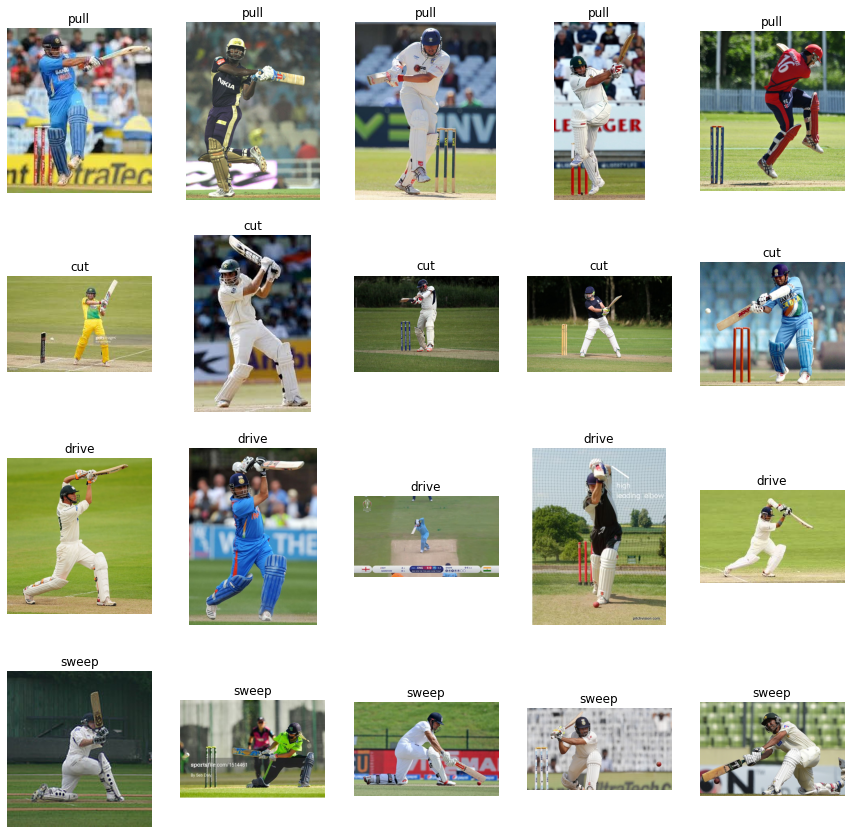

In [ ]:
# visualization library
import matplotlib.pyplot as plt

# for randomness
import random

# create subplots with 4 rows and 5 columns
fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(15,15))

# randomly display 5 images for each shot
# for each folder
for i in range(len(folders)):
    
    # read image names
    names=os.listdir(path+folders[i])
    
    # randomly select 5 image names
    names= random.sample(names, 5)

    # for each image
    for j in range(len(names)):

      # read an image 
      img = cv2.imread(path+ folders[i]+ '/' +names[j])

      # convert BGR to RGB
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

      # display image
      ax[i, j].imshow(img)

      # set folder name as title
      ax[i, j].set_title(folders[i])

      # Turn off axis
      ax[i, j].axis('off')

### 3. Data Augmentation

In [ ]:
# image augmentation
aug_images=[]
aug_labels=[]

# for each image in training data
for idx in range(len(images)):

  # fetch an image and label
  img  = images[idx]
  label= labels[idx]

  # flip an image
  img_flip = cv2.flip(img, 1)

  # append augmented image to list
  aug_images.append(img_flip)

  # append label to list
  aug_labels.append(label)  

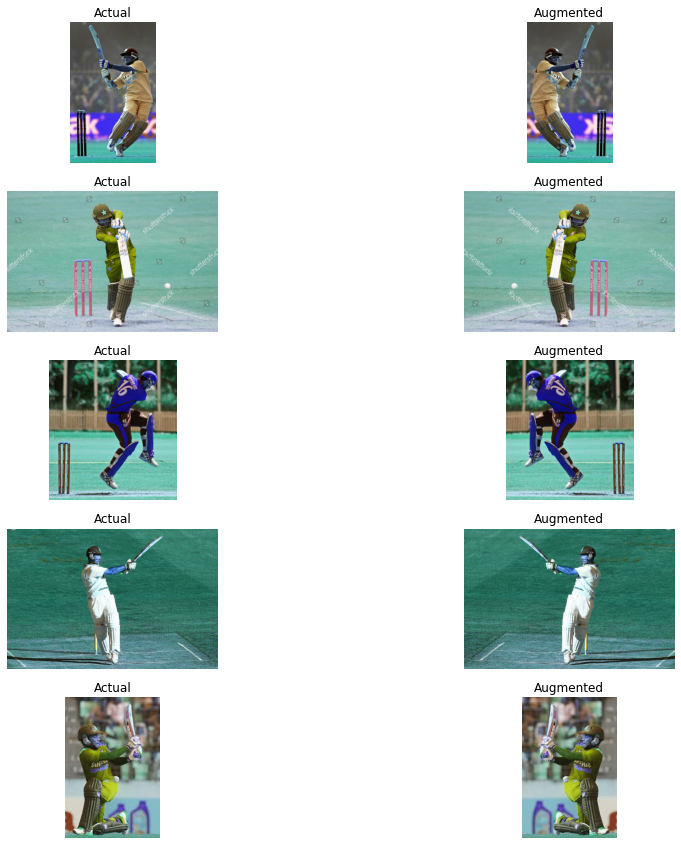

In [ ]:
# display actual and augmented image for sample images

# create indices
ind = range(len(aug_images))

# randomly sample indices
ind = random.sample(ind, 5)

# create subplots with 5 rows and 2 columns
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(15,15))

# for each row 
for row in range(5):
  
  # for each column
  for col in range(2):
    
    # first column for actual image
    if col==0:
      
      # display actual image
      ax[row, col].imshow(images[ ind[row] ] )

      # set title
      ax[row, col].set_title('Actual')

      # Turn off axis
      ax[row, col].axis('off')

    # second column for augmented image
    else:

      # display augmented image      
      ax[row, col].imshow(aug_images[ ind[row] ] )

      # set title
      ax[row, col].set_title('Augmented')

      # Turn off axis
      ax[row, col].axis('off')

In [ ]:
# combine actual and augmented images & labels
images = images + aug_images
labels = labels + aug_labels

In [ ]:
# number of images
len(images)

580

### 4. Detecting pose using detectron2

In [ ]:
# import some common detectron2 utilities
# to obtain pretrained models
from detectron2 import model_zoo

# set up predictor
from detectron2.engine import DefaultPredictor

# set config
from detectron2.config import get_cfg

# define configure instance
cfg = get_cfg()

# get a model specified by relative path under Detectron2’s official configs/ directory.
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_101_FPN_3x.yaml"))

# download pretrained model 
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_101_FPN_3x.yaml")

# set threshold for this model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  

# create predictor
predictor = DefaultPredictor(cfg)

model_final_997cc7.pkl: 313MB [00:14, 21.2MB/s]                           


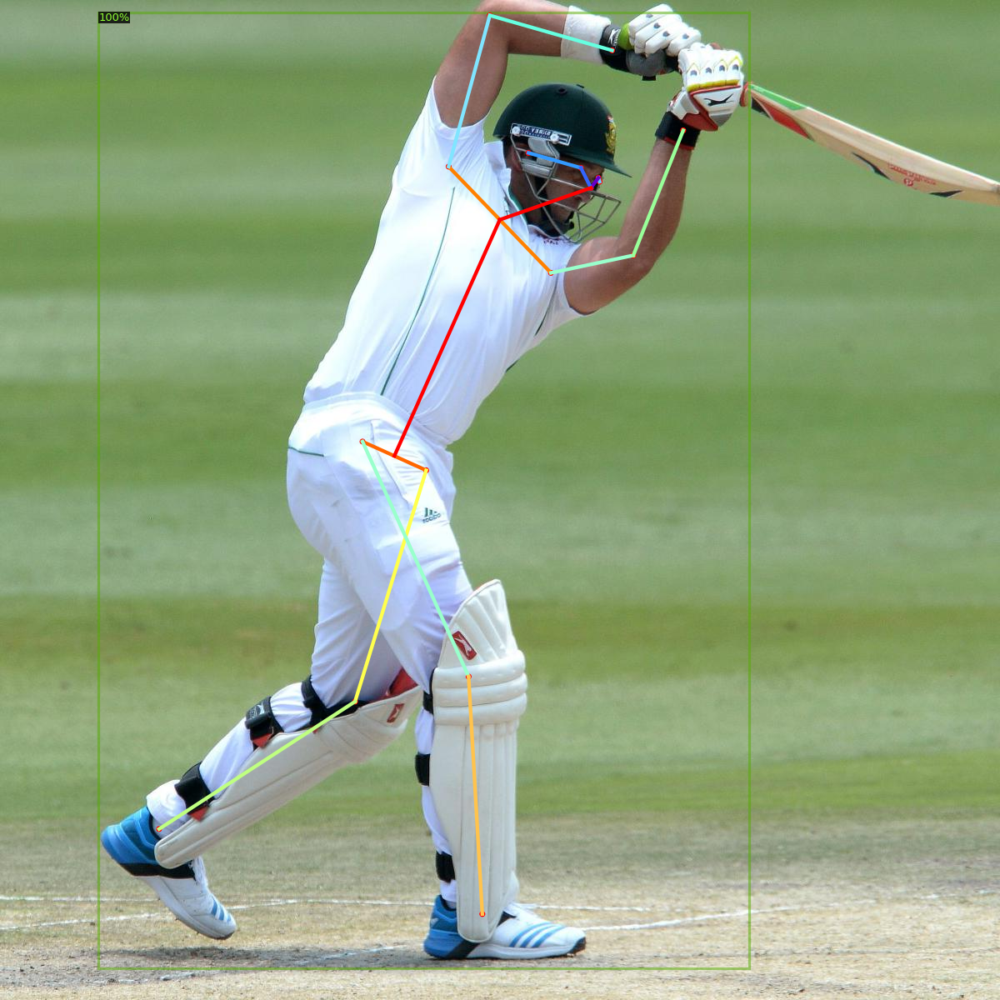

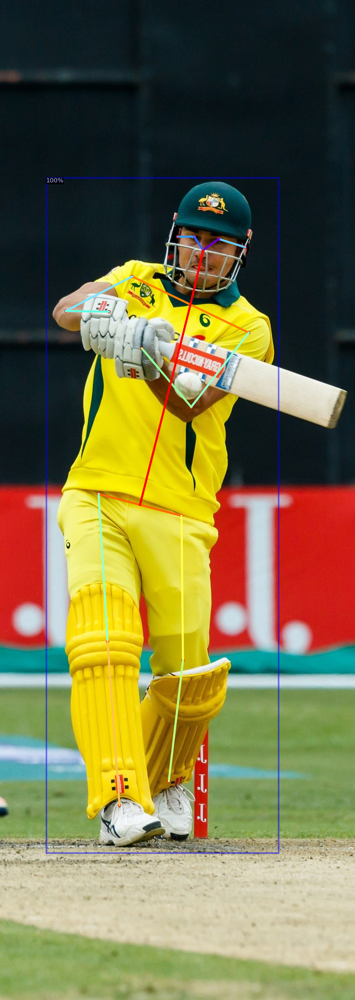

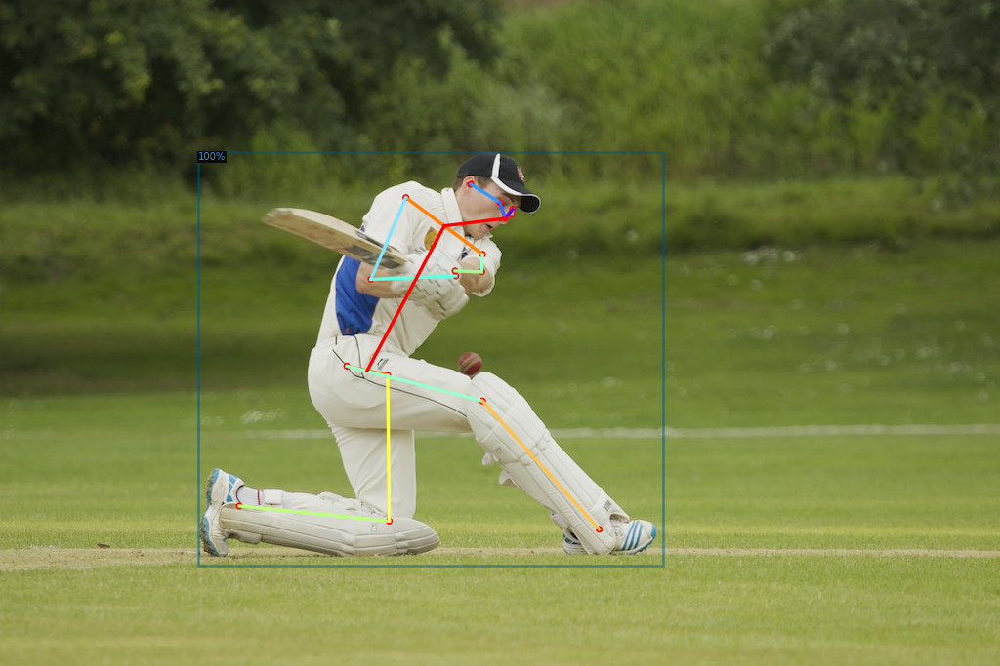

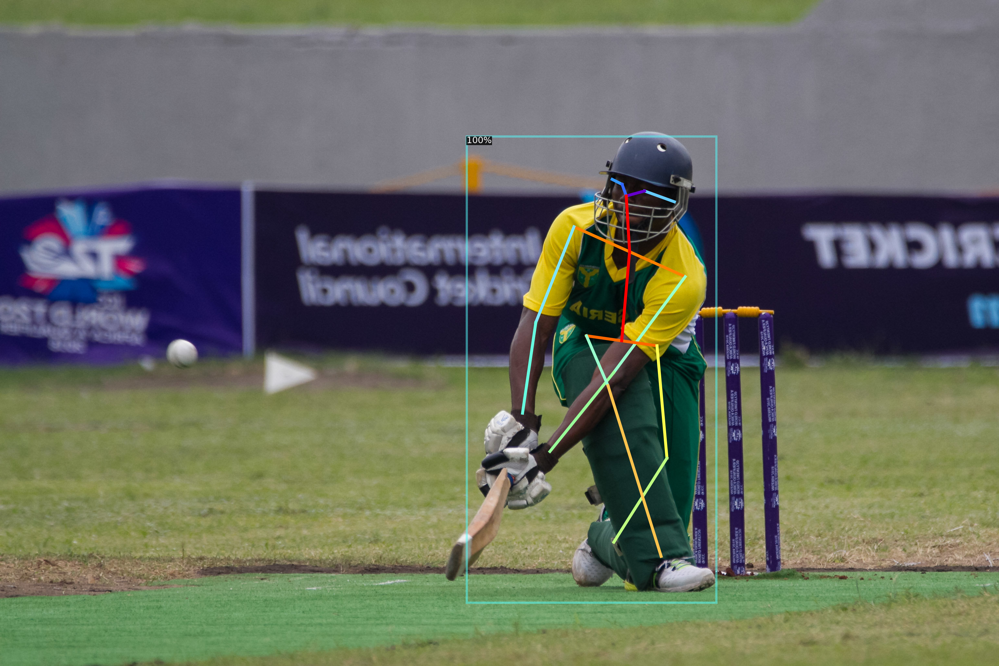

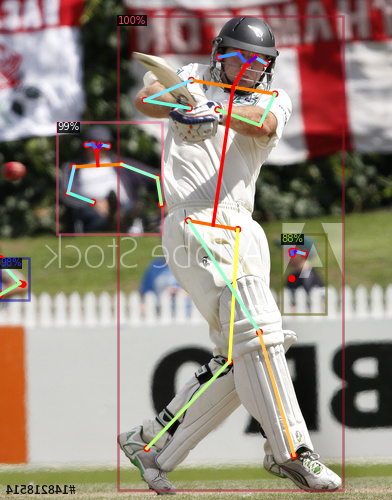

In [ ]:
# for drawing predictions on images
from detectron2.utils.visualizer import Visualizer

# to obtain metadata
from detectron2.data import MetadataCatalog

# to display an image
from google.colab.patches import cv2_imshow

# randomly select images
for img in random.sample(images,5):    
  
    # make predictions
    outputs = predictor(img)
    
    # use `Visualizer` to draw the predictions on the image.
    v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
    
    # draw prediction on image
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    
    # display image
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
# define function that extracts the keypoints for an image
def extract_keypoints(img):  
  
  # make predictions
  outputs = predictor(img)
  
  # fetch keypoints
  keypoints = outputs['instances'].pred_keypoints
  
  # convert to numpy array
  kp = keypoints.cpu().numpy()
  
  # if keypoints detected
  if(len(keypoints)>0):
    
    # fetch keypoints of a person with maximum confidence score
    kp = kp[0]
    kp = np.delete(kp,2,1)
    
    # convert 2D array to 1D array
    kp = kp.flatten()
    
    # return keypoints
    return kp

In [ ]:
# progress bar
from tqdm import tqdm
import numpy as np

# create list
keypoints   = []

# for every image
for i in tqdm(range(len(images))):
  
  # extract keypoints
  kp = extract_keypoints(images[i])
  
  # append keypoints 
  keypoints.append(kp)

### 5. Classifying cricket shot using pose of a player



In [ ]:
# for normalization
from sklearn.preprocessing import StandardScaler

# define normalizer
scaler= StandardScaler()

# normalize keypoints
keypoints = scaler.fit_transform(keypoints)

# convert to an array
keypoints = np.array(keypoints)

In [ ]:
# converting the target categories into numbers
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y=le.fit_transform(labels)

In [ ]:
# for creating training and validation sets
from sklearn.model_selection import train_test_split

# split keypoints and labels in 80:20
x_tr, x_val, y_tr, y_val = train_test_split(keypoints, y, test_size=0.2, stratify=labels, random_state=120)

In [ ]:
# converting the keypoints and target value to tensor
import torch
x_tr = torch.Tensor(x_tr)
x_val = torch.Tensor(x_val)
y_tr = torch.Tensor(y_tr)
y_tr = y_tr.type(torch.long)
y_val = torch.Tensor(y_val)
y_val = y_val.type(torch.long)

In [ ]:
# shape of training and validation set
(x_tr.shape, y_tr.shape), (x_val.shape, y_val.shape)

In [ ]:
# importing libraries for defining the architecture of model
from torch.autograd import Variable
from torch.optim import Adam
from torch.nn import Linear, ReLU, Sequential, Softmax, CrossEntropyLoss

In [ ]:
# defining the model architecture
model = Sequential(Linear(34, 64),
                   ReLU(),
                   Linear(64, 4),
                   Softmax()
                   )

In [ ]:
# define optimizer and loss function
optimizer = Adam(model.parameters(), lr=0.01)
criterion = CrossEntropyLoss()

# checking if GPU is available
if torch.cuda.is_available():
    model = model.cuda()
    criterion = criterion.cuda()

In [ ]:
def train(epoch):

    model.train()
    tr_loss = 0

    # getting the training set
    x_train, y_train = Variable(x_tr), Variable(y_tr)
    # getting the validation set
    x_valid, y_valid = Variable(x_val), Variable(y_val)

    # converting the data into GPU format
    if torch.cuda.is_available():
        x_train = x_train.cuda()
        y_train = y_train.cuda()
        x_valid = x_valid.cuda()
        y_valid = y_valid.cuda()

    # clearing the Gradients of the model parameters
    optimizer.zero_grad()
    
    # prediction for training and validation set
    output_train = model(x_train)
    output_val = model(x_valid)

    # computing the training and validation loss
    loss_train = criterion(output_train, y_train)
    loss_val = criterion(output_val, y_valid)

    # computing the updated weights of all the model parameters
    loss_train.backward()
    optimizer.step()
    if epoch%10 == 0:
        # printing the validation loss
        print('Epoch : ',epoch+1, '\t', 'loss :', loss_val.item())

In [ ]:
# defining the number of epochs
n_epochs = 100

# training the model
for epoch in range(n_epochs):
    train(epoch)

### 6. Evaluating model performance

In [ ]:
# to check the model performance
from sklearn.metrics import accuracy_score

In [ ]:
# get validation accuracy
x, y = Variable(x_val), Variable(y_val)
if torch.cuda.is_available():
  x_val = x.cuda()
  y_val = y.cuda()
pred = model(x_val)
final_pred = np.argmax(pred.cpu().data.numpy(), axis=1)
accuracy_score(y_val.cpu(), final_pred)